In [1]:
import math
import sympy as sym
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Line3DCollection
import numpy as np
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
from sympy.abc import beta
from scipy.integrate import quad
from scipy.special import lambertw, expit
from sympy import I

from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
plt.rc('axes', labelsize=20)
plt.rc('axes', titlesize=20)

# Solving for DC analysis coefficients

In [3]:
ir1, ir2, ic, ie, r = sym.symbols('ir1, ir2, ic, ie, r')
r1, r2, r3, rch = sym.symbols('r1, r2, r3, rch')
vbc, vbe, vs = sym.symbols('vbc, vbe, vs')
Is, bf, br, ebc, ebe = sym.symbols('Is, bf, br, ebc, ebe')

In [4]:
f1 = vs - ir1*r1 - ir2*r2
f2 = vs - ic*rch + vbc - vbe - ie*r3
f3 = ir1*r1 - ic*rch + vbc
f4 = ir2*r2 - vbe - ie*r3
f5 = ir2 + ie - ir1 - ic
f6 = ic*(bf+1)/Is - ie*bf/Is + ebc*(bf+br+1)/br - (bf+br+1)/br
f7 = ic*br/Is - ie*(br+1)/Is + ebe*(br+bf+1)/bf - (br+bf+1)/bf
f8 = -(ie-ic)/Is + (ebe-1)/bf + (ebc-1)/br
f = [f1, f2, f3, f4, f5, f6, f7, f8]
for i in f: i

-ir1*r1 - ir2*r2 + vs

-ic*rch - ie*r3 + vbc - vbe + vs

-ic*rch + ir1*r1 + vbc

-ie*r3 + ir2*r2 - vbe

-ic + ie - ir1 + ir2

ebc*(bf + br + 1)/br - (bf + br + 1)/br - bf*ie/Is + ic*(bf + 1)/Is

ebe*(bf + br + 1)/bf - (bf + br + 1)/bf + br*ic/Is - ie*(br + 1)/Is

(ebc - 1)/br + (ebe - 1)/bf + (ic - ie)/Is

In [5]:
g1 = sym.solve(f5, ic)[0] - sym.solve(f7, ic)[0]
g2 = sym.solve(f5, ic)[0] - sym.solve(f2, ic)[0]
g3 = sym.solve(f5, ic)[0] - sym.solve(f3, ic)[0]
g1 = sym.solve(f4, ir2)[0] - sym.solve(g1, ir2)[0]
g2 = sym.solve(f4, ir2)[0] - sym.solve(g2, ir2)[0]
g3 = sym.solve(f4, ir2)[0] - sym.solve(g3, ir2)[0]
g4 = sym.solve(f4, ir2)[0] - sym.solve(f1, ir2)[0]
g1 = sym.solve(g4, ir1)[0] - sym.solve(g1, ir1)[0]
g2 = sym.solve(g4, ir1)[0] - sym.solve(g2, ir1)[0]
g3 = sym.solve(g4, ir1)[0] - sym.solve(g3, ir1)[0]
g1 = sym.solve(g3, vbe)[0] - sym.solve(g1, vbe)[0]
h1 = sym.solve(g1, ie)[0] - sym.solve(g2 + g3, ie)[0]
h1
print(h1)

-(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) + (Is*bf*ebe*r1*r2 + Is*bf*ebe*r1*rch + Is*bf*ebe*r2*rch - Is*bf*r1*r2 - Is*bf*r1*rch - Is*bf*r2*rch + Is*br*ebe*r1*r2 + Is*br*ebe*r1*rch + Is*br*ebe*r2*rch - Is*br*r1*r2 - Is*br*r1*rch - Is*br*r2*rch + Is*ebe*r1*r2 + Is*ebe*r1*rch + Is*ebe*r2*rch - Is*r1*r2 - Is*r1*rch - Is*r2*rch + bf*br*r1*vbc + bf*br*r1*vs + bf*br*r2*vbc)/(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))

-(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) + (Is*bf*ebe*r1*r2 + Is*bf*ebe*r1*rch + Is*bf*ebe*r2*rch - Is*bf*r1*r2 - Is*bf*r1*rch - Is*bf*r2*rch + Is*br*ebe*r1*r2 + Is*br*ebe*r1*rch + Is*br*ebe*r2*rch - Is*br*r1*r2 - Is*br*r1*rch - Is*br*r2*rch + Is*ebe*r1*r2 + Is*ebe*r1*rch + Is*ebe*r2*rch - Is*r1*r2 - Is*r1*rch - Is*r2*rch + bf*br*r1*vbc + bf*br*r1*vs + bf*br*r2*vbc)/(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))


In [6]:
j1 = h1.replace(ebe,0)/ebe
sym.simplify(j1)
print(j1)

(-bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) - (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc))/(bf*ebe*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))

(-(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) + (-Is*bf*r1*r2 - Is*bf*r1*rch - Is*bf*r2*rch - Is*br*r1*r2 - Is*br*r1*rch - Is*br*r2*rch - Is*r1*r2 - Is*r1*rch - Is*r2*rch + bf*br*r1*vbc + bf*br*r1*vs + bf*br*r2*vbc)/(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)))/ebe


In [7]:
g1 = sym.solve(f5, ic)[0] - sym.solve(f6, ic)[0]
g2 = sym.solve(f5, ic)[0] - sym.solve(f2, ic)[0]
g3 = sym.solve(f5, ic)[0] - sym.solve(f3, ic)[0]
g1 = sym.solve(f4, ir2)[0] - sym.solve(g1, ir2)[0]
g2 = sym.solve(f4, ir2)[0] - sym.solve(g2, ir2)[0]
g3 = sym.solve(f4, ir2)[0] - sym.solve(g3, ir2)[0]
g4 = sym.solve(f4, ir2)[0] - sym.solve(f1, ir2)[0]
g1 = sym.solve(g4, ir1)[0] - sym.solve(g1, ir1)[0]
g2 = sym.solve(g4, ir1)[0] - sym.solve(g2, ir1)[0]
g3 = sym.solve(g4, ir1)[0] - sym.solve(g3, ir1)[0]
g1 = sym.solve(g3, vbe)[0] - sym.solve(g1, vbe)[0]
h2 = sym.solve(g1, ie)[0] - sym.solve(g2 + g3, ie)[0]
h2
print(h2)

-(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) + (Is*bf*ebc*r1*r2 + Is*bf*ebc*r1*rch + Is*bf*ebc*r2*rch - Is*bf*r1*r2 - Is*bf*r1*rch - Is*bf*r2*rch + Is*br*ebc*r1*r2 + Is*br*ebc*r1*rch + Is*br*ebc*r2*rch - Is*br*r1*r2 - Is*br*r1*rch - Is*br*r2*rch + Is*ebc*r1*r2 + Is*ebc*r1*rch + Is*ebc*r2*rch - Is*r1*r2 - Is*r1*rch - Is*r2*rch + bf*br*r1*vbc + bf*br*r1*vs + bf*br*r2*vbc + br*r1*vbc + br*r1*vs + br*r2*vbc)/(br*(bf*r1*rch + bf*r2*rch - r1*r2))

-(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) + (Is*bf*ebc*r1*r2 + Is*bf*ebc*r1*rch + Is*bf*ebc*r2*rch - Is*bf*r1*r2 - Is*bf*r1*rch - Is*bf*r2*rch + Is*br*ebc*r1*r2 + Is*br*ebc*r1*rch + Is*br*ebc*r2*rch - Is*br*r1*r2 - Is*br*r1*rch - Is*br*r2*rch + Is*ebc*r1*r2 + Is*ebc*r1*rch + Is*ebc*r2*rch - Is*r1*r2 - Is*r1*rch - Is*r2*rch + bf*br*r1*vbc + bf*br*r1*vs + bf*br*r2*vbc + br*r1*vbc + br*r1*vs + br*r2*vbc)/(br*(bf*r1*rch + bf*r2*rch - r1*r2))


In [8]:
j2 = h2.replace(ebc, 0)/ebc
sym.simplify(j2)

(-br*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) - (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc - br*r1*vbc - br*r1*vs - br*r2*vbc))/(br*ebc*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch))

In [9]:
k1 = sym.simplify((j1-j2)*ebe*ebc)
k1
print(k1)

(bf*ebe*(br*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) + (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc - br*r1*vbc - br*r1*vs - br*r2*vbc))*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch) - br*ebc*(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) + (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc))*(bf*r1*rch + bf*r2*rch - r1*r2))/(bf*br*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))

(bf*ebe*(br*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) + (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc - br*r1*vbc - br*r1*vs - br*r2*vbc))*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch) - br*ebc*(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) + (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc))*(bf*r1*rch + bf*r2*rch - r1*r2))/(bf*br*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))


In [10]:
k2 = k1*(bf*br*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))
sym.simplify(k2)

bf*ebe*(br*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) + (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc - br*r1*vbc - br*r1*vs - br*r2*vbc))*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch) - br*ebc*(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) + (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc))*(bf*r1*rch + bf*r2*rch - r1*r2)

In [11]:
k2.replace(ebc, 0)
k2.replace(ebe, 0)

bf*ebe*(br*(bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) + (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc - br*r1*vbc - br*r1*vs - br*r2*vbc))*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)

-br*ebc*(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)*(r1*r2*vbc - r1*r2*vbe + r1*r2*vs - r1*rch*vbe - r2*rch*vbe + r2*rch*vs) + (r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(Is*bf*r1*r2 + Is*bf*r1*rch + Is*bf*r2*rch + Is*br*r1*r2 + Is*br*r1*rch + Is*br*r2*rch + Is*r1*r2 + Is*r1*rch + Is*r2*rch - bf*br*r1*vbc - bf*br*r1*vs - bf*br*r2*vbc))*(bf*r1*rch + bf*r2*rch - r1*r2)

In [12]:
p3 = h1.replace(vbe, 0).replace(vbc, 0).replace(ebe, 0)
p6 = h2.replace(vbe, 0).replace(vbc, 0).replace(ebc, 0)
v1 = sym.simplify(h1 - p3)
w1 = sym.simplify(h2 - p6)

In [13]:
p1 = sym.simplify(v1.replace(vbc, 0).replace(ebe, 0)).replace(vbe,1)
p4 = sym.simplify(w1.replace(vbc, 0).replace(ebc, 0)).replace(vbe,1)
p2 = sym.simplify(v1.replace(vbe, 0).replace(ebe, 0)).replace(vbc,1)
p5 = sym.simplify(w1.replace(vbe, 0).replace(ebc, 0)).replace(vbc,1)
l1 = sym.simplify(v1.replace(vbe, 0).replace(vbc, 0)).replace(ebe,1)
l2 = sym.simplify(w1.replace(vbe, 0).replace(vbc, 0)).replace(ebc,1)

In [14]:
P = [p1, p2, l1, p3, p4, p5, l2, p6]
for i in P: print(i)

(r1*r2 + r1*rch + r2*rch)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)
(br*(r1 + r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) - r1*r2*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))/((r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))
Is*(bf*r1*r2 + bf*r1*rch + bf*r2*rch + br*r1*r2 + br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)/(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))
-(r1*r2*vs + r2*rch*vs)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) + (-Is*bf*r1*r2 - Is*bf*r1*rch - Is*bf*r2*rch - Is*br*r1*r2 - Is*br*r1*rch - Is*br*r2*rch - Is*r1*r2 - Is*r1*rch - Is*r2*rch + bf*br*r1*vs)/(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))
(r1*r2 + r1*rch + r2*rch)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)
(-r1*r2*(bf*r1*rch + bf*r2*rch - r1*r2) + (bf*r1 + bf*r2 + r1 + r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch))/((bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch))
Is*(bf*r1*r2 + bf*

In [57]:
c1, c2, c3, c4 = 10e-9, 10e-9, 22e-9, 22e-8

l, lch = 1e-6, 200e-6

x = 1.6e3
r1, r2, r3, rl, rch = x, 1e4-x, 515.0, 2.0, 12.0

Is = 5e-13
vs = 9.0
vt = .025
bf = 100
br = 10 

In [106]:
#Halley's method

p1 = (r1*r2 + r1*rch + r2*rch)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)
p2 = (br*(r1 + r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) - r1*r2*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))/((r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))
p3 = Is*(bf*r1*r2 + bf*r1*rch + bf*r2*rch + br*r1*r2 + br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)/(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))
p4 = -(r1*r2*vs + r2*rch*vs)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) + (-Is*bf*r1*r2 - Is*bf*r1*rch - Is*bf*r2*rch - Is*br*r1*r2 - Is*br*r1*rch - Is*br*r2*rch - Is*r1*r2 - Is*r1*rch - Is*r2*rch + bf*br*r1*vs)/(bf*(br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch))
p5 = (r1*r2 + r1*rch + r2*rch)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch)
p6 = (-r1*r2*(bf*r1*rch + bf*r2*rch - r1*r2) + (bf*r1 + bf*r2 + r1 + r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch))/((bf*r1*rch + bf*r2*rch - r1*r2)*(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch))
p7 = Is*(bf*r1*r2 + bf*r1*rch + bf*r2*rch + br*r1*r2 + br*r1*rch + br*r2*rch + r1*r2 + r1*rch + r2*rch)/(br*(bf*r1*rch + bf*r2*rch - r1*r2))
p8 = -(r1*r2*vs + r2*rch*vs)/(r1*r2*r3 + r1*r2*rch + r1*r3*rch + r2*r3*rch) + (-Is*bf*r1*r2 - Is*bf*r1*rch - Is*bf*r2*rch - Is*br*r1*r2 - Is*br*r1*rch - Is*br*r2*rch - Is*r1*r2 - Is*r1*rch - Is*r2*rch + bf*br*r1*vs + br*r1*vs)/(br*(bf*r1*rch + bf*r2*rch - r1*r2))

def z1(Vbc): return (p3/(p1*vt))*np.exp(-(p2*Vbc+p4)/(p1*vt))
def z2(Vbe): return (p7/(p6*vt))*np.exp(-(p5*Vbe+p8)/(p6*vt))
def w0(Vbc, Vbe):
    return [-(Vbe+(p2*Vbc+p4)/p1)/vt, -(Vbc+(p5*Vbe+p8)/p6)/vt]

z = [z1, z2]

V = [.5, .5] # Vbc, Vbe
w = w0(V[0], V[1])


for i in range(500):
    for j in range(len(z)):
        for k in range(500):
            w[j] = w[j] - (w[j] - z[j](V[j])*np.exp(-w[j]))/((w[j]+1)-((w[j]+2)*(w[j] - z[j](V[j]))*np.exp(-w[j]))/(2*w[j]+2))
            if j == 0:
                Vbe = -w[0]*vt-(p2*V[0]+p4)/p1
                V[1] = Vbe
            if j == 1:
                Vbc = -w[1]*vt-(p5*V[1]+p8)/p6
                V[0] = Vbc
            #V = [Vbc, Vbe]
V      
Ie0 = Is*((np.exp((V[1])/vt)-np.exp((V[0])/vt))+(1/bf)*(np.exp((V[1])/vt)-1))
Ic0 = Is*((np.exp((V[1])/vt)-np.exp((V[0])/vt))-(1/br)*(np.exp((V[0])/vt)-1))
Ie0
Ic0

vc10 = Ie0*r3 + V[1] - V[0]
vc10
vc20 = 0
vc20
vc30 = Ie0*r3
vc40 = V[1] + vc30 - vc20
vc30
vc40

x0 = [vc10,0,vc30,vc40,0,Ic0,Ie0,Ic0]
x0

[0.5001838626818784, 0.5681300614051543]

0.003494333525231561

0.003432879301544342

1.86752796421753

0

1.7995817654942539

2.3677118268994084

[1.86752796421753,
 0,
 1.7995817654942539,
 2.3677118268994084,
 0,
 0.003432879301544342,
 0.003494333525231561,
 0.003432879301544342]

In [59]:
def f1(vc1, vc2, vc3, vc4, il, ich):
    return (1/c1)*(ich-ic(vc1, vc2, vc3, vc4)-il)

def f2(vc1, vc2, vc3, vc4, il, ich):
    return (1/c2)*(il+vs/r1-(vc4+vc2)*(1/r1+1/r2)-ie(vc1, vc2, vc3, vc4)+ic(vc1, vc2, vc3, vc4))

def f3(vc1, vc2, vc3, vc4, il, ich):
    return (1/c3)*(ie(vc1, vc2, vc3, vc4)-vc3/r3)

def f4(vc1, vc2, vc3, vc4, il, ich):
    return (1/c4)*(vs/r1 - (vc4+vc2)*(1/r1+1/r2)-ie(vc1, vc2, vc3, vc4) + ic(vc1, vc2, vc3, vc4))

def f5(vc1, vc2, vc3, vc4, il, ich):
    return (1/l)*(vc1-vc2-il*rl)

def f6(vc1, vc2, vc3, vc4, il, ich):
    return (1/lch)*(vs-vc1-rch*ich)

def ie(vc1, vc2, vc3, vc4):
    return Is*((np.exp((vc4+vc2-vc3)/vt)-np.exp((vc4+vc2-vc1)/vt))+(1/bf)*(np.exp((vc4+vc2-vc3)/vt)-1))
    
def ic(vc1, vc2, vc3, vc4):
    return Is*((np.exp((vc4+vc2-vc3)/vt)-np.exp((vc4+vc2-vc1)/vt))-(1/br)*(np.exp((vc4+vc2-vc1)/vt)-1))

In [60]:
def RK(t, h, x0):

    f = [f1, f2, f3, f4, f5, f6] #FUNCTIONS AS DEFINED ABOVE
    
    k1 = [0,0,0,0,0,0,0,0] #THESE HOLD THE STATE VARIABLE VALUES FOR EACH STEP
    k2 = [0,0,0,0,0,0,0,0]
    k3 = [0,0,0,0,0,0,0,0]
    k4 = [0,0,0,0,0,0,0,0]
    
    x1 = [x0[0]] #STATE VARIABLE ARRAYS
    x2 = [x0[1]]
    x3 = [x0[2]]
    x4 = [x0[3]]
    x5 = [x0[4]]
    x6 = [x0[5]]
    i_e = [x0[6]]
    i_c = [x0[7]]

    p = 0 #COUNTER VARIABLES
    q = 0
    
    for i in t:
        
        for j in f:
            k1[q] = j(x1[p], x2[p], x3[p], x4[p], x5[p], x6[p])
            q+=1
        q = 0
        for j in f:
            k2[q] = j(x1[p]+(h/2)*k1[0], x2[p]+(h/2)*k1[1], x3[p]+(h/2)*k1[2], x4[p]+(h/2)*k1[3], x5[p]+(h/2)*k1[4], x6[p]+(h/2)*k1[5])
            q+=1
        q = 0
        k2
        for j in f:
            k3[q] = j(x1[p]+(h/2)*k2[0], x2[p]+(h/2)*k2[1], x3[p]+(h/2)*k2[2], x4[p]+(h/2)*k2[3], x5[p]+(h/2)*k2[4], x6[p]+(h/2)*k2[5])
            q+=1
        q = 0
        for j in f:
            k4[q] = j(x1[p]+h*k3[0], x2[p]+h*k3[1], x3[p]+h*k3[2], x4[p]+h*k3[3], x5[p]+h*k3[4], x6[p]+h*k3[5])
            q+=1
        q = 0
        if p==len(t)-1: break
        
        x1.append(x1[p]+(h/6)*(k1[0]+2*k2[0]+2*k3[0]+k4[0]))
        x2.append(x2[p]+(h/6)*(k1[1]+2*k2[1]+2*k3[1]+k4[1]))
        x3.append(x3[p]+(h/6)*(k1[2]+2*k2[2]+2*k3[2]+k4[2]))
        x4.append(x4[p]+(h/6)*(k1[3]+2*k2[3]+2*k3[3]+k4[3]))
        x5.append(x5[p]+(h/6)*(k1[4]+2*k2[4]+2*k3[4]+k4[4]))
        x6.append(x6[p]+(h/6)*(k1[5]+2*k2[5]+2*k3[5]+k4[5]))
        i_e.append(ie(x1[p], x2[p], x3[p], x4[p]))
        i_c.append(ic(x1[p], x2[p], x3[p], x4[p]))
        
        p+=1
        
    return x1, x2, x3, x4, x5, x6, i_e, i_c

In [65]:
h = 0.0000000001
t = np.arange(0, 0.000064, h)
state_var = RK(t, h, x0)

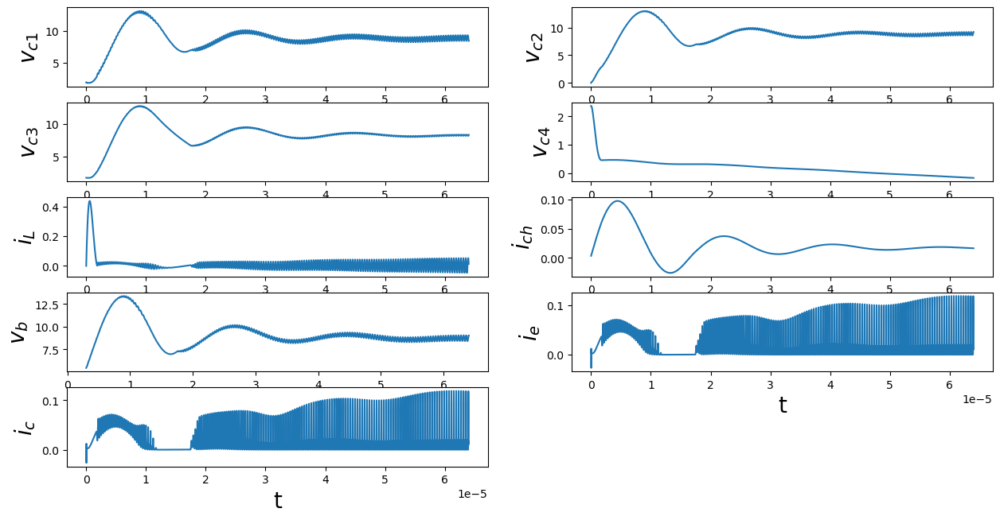

In [66]:
fig = plt.figure(figsize=(15,7.5))

ax0 = fig.add_subplot(5, 2, 1, xlabel='t', ylabel='$v_{c1}$')
ax0.plot(t, state_var[0])

ax1 = fig.add_subplot(5, 2, 2, xlabel='t', ylabel='$v_{c2}$',)
ax1.plot(t, state_var[1])

ax2 = fig.add_subplot(5, 2, 3, xlabel='t', ylabel='$v_{c3}$',)
ax2.plot(t, state_var[2])

ax3 = fig.add_subplot(5, 2, 4, xlabel='t', ylabel='$v_{c4}$',)
ax3.plot(t, state_var[3])

ax4 = fig.add_subplot(5, 2, 5, xlabel='t', ylabel='$i_L$',)
ax4.plot(t, state_var[4])

ax5 = fig.add_subplot(5, 2, 6, xlabel='t', ylabel='$i_{ch}$',)
ax5.plot(t, state_var[5])

ax6 = fig.add_subplot(5, 2, 7, xlabel='t', ylabel='$v_b$',)
VB = []
i_tank = []
for i in range(len(state_var[2])):
    VB.append(state_var[1][i]+state_var[3][i])
    i_tank.append(state_var[5][i]-state_var[7][i])
ax6.plot(t[30000:], VB[30000:])

ax7 = fig.add_subplot(5, 2, 8, xlabel='t', ylabel='$i_e$',)
ax7.plot(t, state_var[6])

ax8 = fig.add_subplot(5, 2, 9, xlabel='t', ylabel='$i_c$',)
ax8.plot(t, state_var[6])

In [67]:
len(state_var[0])

640000

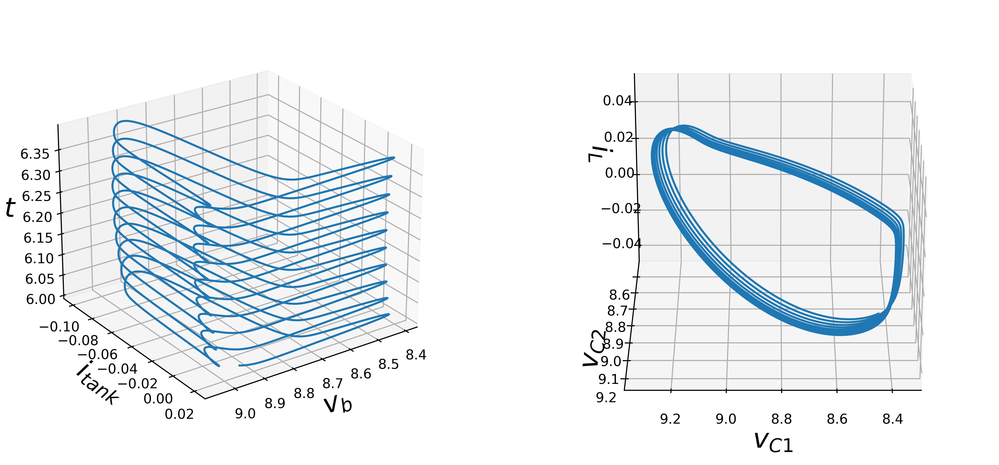

In [73]:
view_1 = (25, 90)
view_2 = (25, 55)
start = 600000

fig = plt.figure(figsize=(13,7), dpi=600)
ax0 = fig.add_subplot(1,2,1, xlabel='$v_b$', ylabel='$i_{tank}$', zlabel='$t$', projection='3d')
ax0.view_init(*view_2)
ax0.plot3D(VB[start:], i_tank[start:], t[start:])
ax0.set_box_aspect(aspect=None, zoom=0.9)


ax1 = fig.add_subplot(1,2,2, xlabel='$v_{C1}$', ylabel='$v_{C2}$', zlabel='$i_L$', projection='3d')
ax1.view_init(*view_1)
ax1.plot3D(state_var[0][start:], state_var[1][start:], state_var[4][start:])



(40000, 1, 3)
(39999, 2, 3)


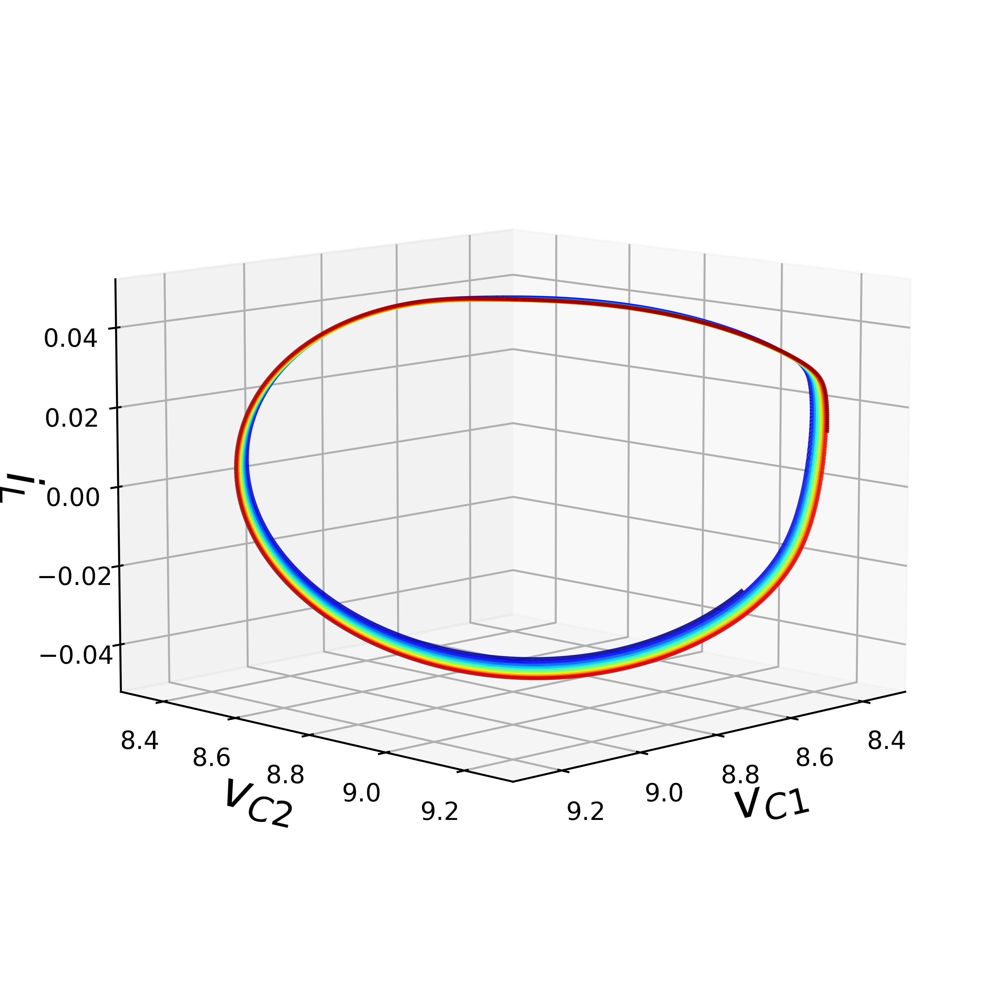

In [104]:
start = 600000
points= np.array([state_var[0][start:], state_var[1][start:], state_var[4][start:]]).transpose().reshape(-1,1,3)
print(points.shape)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
print(segments.shape)
lc = Line3DCollection(segments, cmap=plt.get_cmap('jet'))
s = np.arange(0,len(t[start:]), 1)
lc.set_array(s)
fig = plt.figure(figsize=(13,7), dpi=600)
ax = fig.add_subplot(xlabel='$v_{C1}$', ylabel='$v_{C2}$', zlabel='$i_L$', projection='3d', xlim=(8.3,9.3), ylim=(8.3,9.3), zlim=(-.05,.05))
ax.view_init(10, 45)
ax.add_collection3d(lc)
ax.set_box_aspect(aspect=None, zoom=0.9)
plt.show()


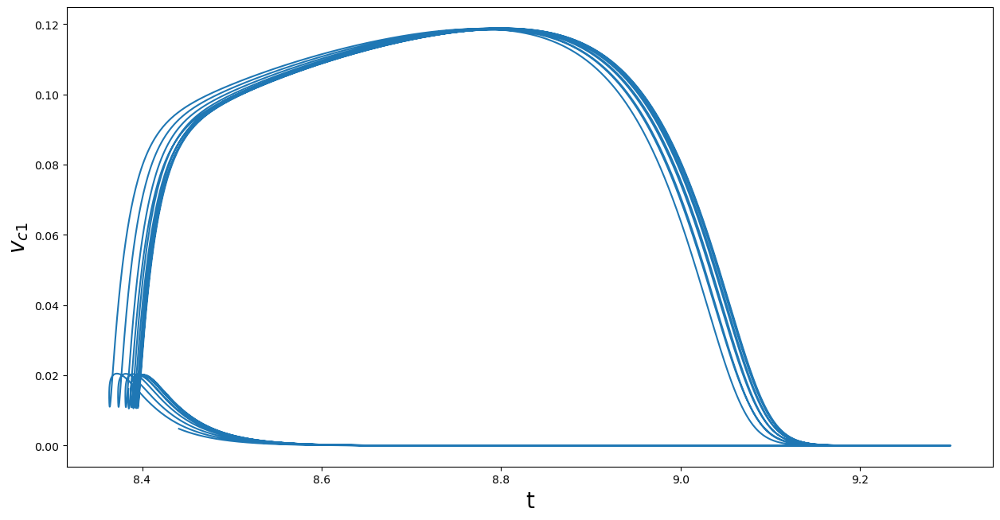

In [76]:
start = 600000
fig = plt.figure(figsize=(15,7.5))
ax0 = fig.add_subplot(1, 1, 1, xlabel='t', ylabel='$v_{c1}$')
ax0.plot(state_var[0][start:], state_var[6][start:])

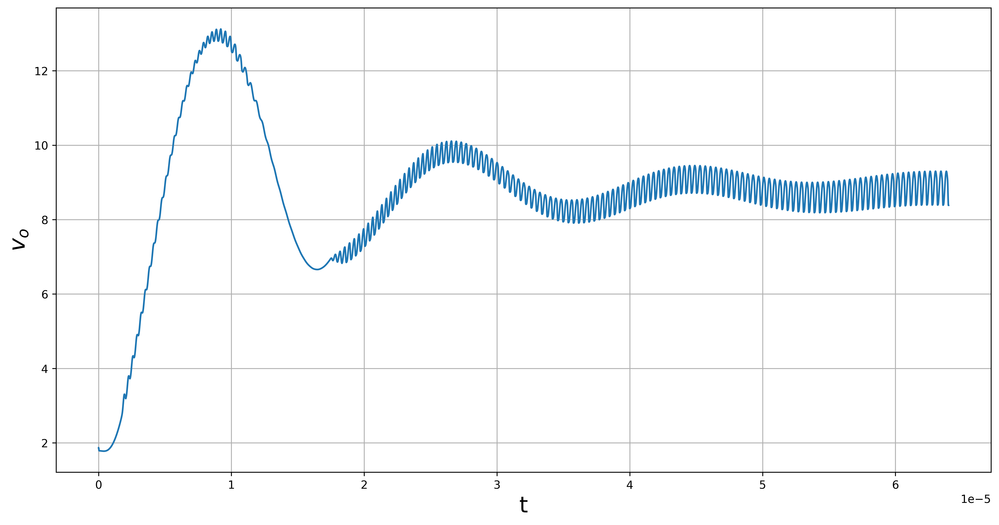

In [77]:
fig = plt.figure(figsize=(15,7.5), dpi=600)

ax0 = fig.add_subplot(1, 1, 1, xlabel='t', ylabel='$v_o$')
ax0.grid()
ax0.plot(t, state_var[0])

In [78]:
min(state_var[6])

-0.026754716579822306

# Fourier Analysis

### Define fourier function and helper functions

In [79]:
def fourier_eq(x,y,z,d):
    return x*np.exp(1j*y*z)

def Ft(s, step):
    t = np.linspace(0, 2*np.pi, len(s))
    gel = []
    for f in range(len(t)):
        bar = 0
        for n in range(len(t)):
            foo = fourier_eq(s[n],n,t[f],step)
            bar += foo
        gel.append(abs(bar))       
        length = int(len(t)/2 - len(t)%2)
    return (np.linspace(0, 1/(2*step), length), gel[:length])

In [80]:
def sample_reduction(samples, time, step, factor):
    
    step = step*factor
    sample_sum = 0
    
    for i in samples:
        sample_sum += i
    
    sample_avg = sample_sum/len(samples)
    reduced_samples = []
    reduced_time = []
    x = len(samples)
    x = x-x%factor
    
    for i in range(int(x/factor)):
        reduced_samples.append(samples[i*factor] - sample_avg)
        reduced_time.append(time[i*factor])
        
    #time_end = len(reduced_samples)*step
    #reduced_time = np.linspace(0, time_end, len(reduced_samples))
    
    return reduced_time, reduced_samples, step

### Initial Fourier comparison plots

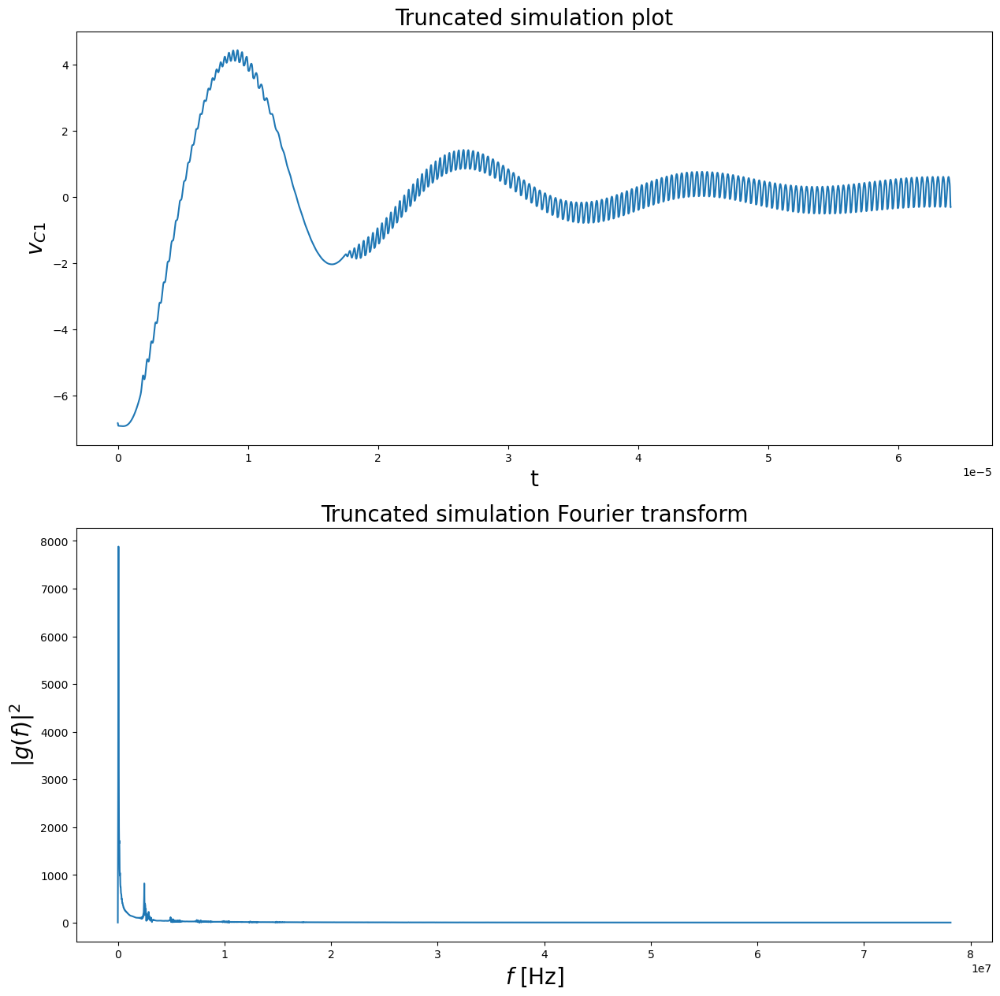

In [82]:
reduced_time, reduced_samples, step = sample_reduction(state_var[0], t, h, 64)
x, y = Ft(reduced_samples, step)

fig = plt.figure(figsize=(15,15))
ax1 = fig.add_subplot(2,1,1, xlabel = 't', ylabel = '$v_{C1}$', title='Truncated simulation plot')
ax1.plot(reduced_time, reduced_samples)
ax3 = fig.add_subplot(2,1,2, xlabel = '$f$ [Hz]', ylabel = '$|g(f)|^2$', title='Truncated simulation Fourier transform')
ax3.plot(x, y)

Import data from practical trace

In [83]:
data = np.genfromtxt('./CSV/WaveData791.csv', delimiter=',', skip_header = 3) ### PULLS IN CSV FILE

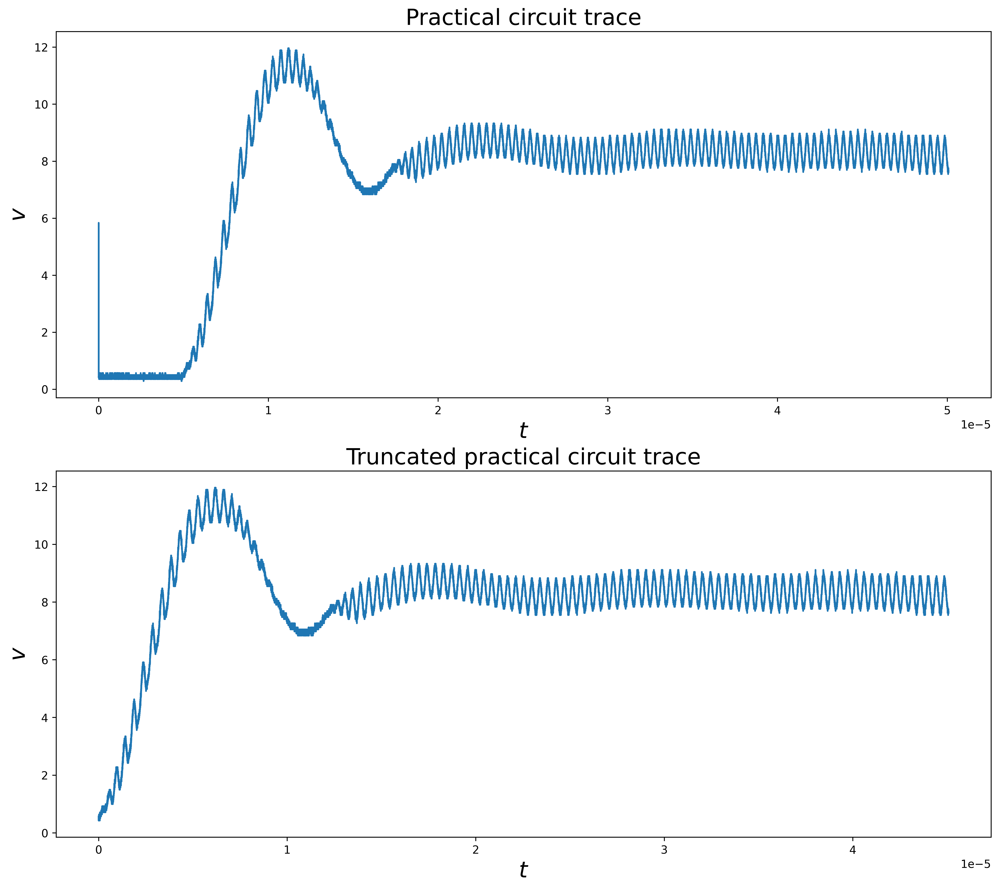

In [84]:
xdata = data[:,0:1]  ### EXTRACT CSV INTO NUMPY ARRAYS
ydata = data[:,1:]
xdata = np.reshape(xdata, xdata.size)
ydata = np.reshape(ydata, ydata.size)
## I HAVE TO MAKE A NEW TIME BASIS B/C MY O-SCOPE ROUNDS
## THE TIME THE HIGHER THE TIME GOES UPON CSV GENERATION
step = xdata[1] - xdata[0]
time_end = len(ydata)*step
xdata=[]
for i in range(len(ydata)): xdata.append(i*step)

fig = plt.figure(figsize=(15,13), dpi=600)
ax0 = fig.add_subplot(2, 1, 1, xlabel='$t$', ylabel='$v$', title='Practical circuit trace')
ax0.plot(xdata, ydata) 

ystart = 4000
#yend = 29600
ydata = ydata[ystart:]
xdata = xdata[:len(ydata)]
#ydata[0:100]
#xdata[-1]


ax0 = fig.add_subplot(2, 1, 2, xlabel='$t$', ylabel='$v$', title='Truncated practical circuit trace')
ax0.plot(xdata, ydata)

In [85]:
step = xdata[1] - xdata[0]
reduced_time, reduced_samples, step = sample_reduction(ydata, xdata, step, 8)
x, y = Ft(reduced_samples, step)

fig = plt.figure(figsize=(15,15), dpi=600)
ax1 = fig.add_subplot(2,1,1, xlabel = 't', ylabel = 'v', title='Truncated practical circuit trace')
ax1.plot(reduced_time, reduced_samples)
ax3 = fig.add_subplot(2,1,2, xlabel = '$f$ [Hz]', ylabel = '$|g(f)|^2$', title='Truncated Practical circuit Fourier transform')
ax3.plot(x, y)

### Spanning in window
I take in the span to include mostly the secondary harmonic.

In [99]:
start = 400000
stop = 450000
reduced_time, reduced_samples, step = sample_reduction(state_var[0][start:stop], t[start:stop], h, 8)

sim_x, sim_y = Ft(reduced_samples, step)

fig = plt.figure(figsize=(15,15), dpi=600)
ax1 = fig.add_subplot(2,1,1, xlabel = 't', ylabel = 'v', title='Truncated simulation plot')
ax1.plot(reduced_time, reduced_samples)
ax3 = fig.add_subplot(2,1,2, xlabel = '$f$ [Hz]', ylabel = '$|g(f)|^2$', title='Truncated simulation Fourier transform', xlim=(0, 5e6))
ax3.plot(sim_x, sim_y)

In [98]:
start = 32000
stop = 37000
ydata_window = ydata[start:]
xdata_window = xdata[start:]
step = xdata_window[1] - xdata_window[0]
reduced_time, reduced_samples, step = sample_reduction(ydata_window, xdata_window, step, 2)
pract_x, pract_y = Ft(reduced_samples, step)

fig = plt.figure(figsize=(15,15), dpi=600)
ax1 = fig.add_subplot(2,1,1, xlabel = 't', ylabel = 'v', title='Truncated practical circuit trace')
ax1.plot(reduced_time, reduced_samples)
ax3 = fig.add_subplot(2,1,2, xlabel = '$f$ [Hz]', ylabel = '$|g(f)|^2$', title='Truncated Practical circuit Fourier transform', xlim=(0,5e6))
ax3.plot(pract_x, pract_y)

In [101]:
t[400000]
t[450000]
xdata[32000]
xdata[-1]

4e-05

4.5e-05

4e-05

4.507875e-05

### Find peaks

In [62]:
def max_index_fw(arr):
    x = max(arr)
    for j in range(len(arr)):
        i = arr[j]
        if i == x:
            x = j
            break
    return x

In [63]:
print('Peak frequency of simulated circuit:')
sim_x[max_index_fw(sim_y)]
print('Peak frequency of practical circuit:')
pract_x[max_index_fw(pract_y)]

Peak frequency of simulated circuit:


2400640.1707121897

Peak frequency of practical circuit:


2321724.7097856137